<a href="https://colab.research.google.com/github/MaDufie/ml_journey/blob/feature%2Fprediction-jan-2024/flight_data_eda.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Flight Data Jan 2024


In [1]:
#connect to google drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pandas.plotting import scatter_matrix
from scipy import stats
import networkx as nx

In [4]:
flight_df = pd.read_csv('/content/drive/MyDrive/My ML Journey/flight_arrival_delay_prediction/data/jan_2024_data/T_ONTIME_MARKETING_2401.csv')

# Exploring Flight Data

## Flight Data Info

In [5]:
flight_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 582425 entries, 0 to 582424
Data columns (total 37 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   YEAR                 582425 non-null  int64  
 1   QUARTER              582425 non-null  int64  
 2   MONTH                582425 non-null  int64  
 3   DAY_OF_MONTH         582425 non-null  int64  
 4   DAY_OF_WEEK          582425 non-null  int64  
 5   MKT_UNIQUE_CARRIER   582425 non-null  object 
 6   MKT_CARRIER_FL_NUM   582425 non-null  int64  
 7   OP_UNIQUE_CARRIER    582425 non-null  object 
 8   ORIGIN_AIRPORT_ID    582425 non-null  int64  
 9   ORIGIN               582425 non-null  object 
 10  ORIGIN_CITY_NAME     582425 non-null  object 
 11  ORIGIN_STATE_ABR     582425 non-null  object 
 12  DEST_AIRPORT_ID      582425 non-null  int64  
 13  DEST                 582425 non-null  object 
 14  DEST_CITY_NAME       582425 non-null  object 
 15  DEST_STATE_ABR   

In [6]:
flight_df.head()

,YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,MKT_UNIQUE_CARRIER,MKT_CARRIER_FL_NUM,OP_UNIQUE_CARRIER,ORIGIN_AIRPORT_ID,ORIGIN,...,ARR_DEL15,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,DISTANCE,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY
0,2024,1,1,1,1,AA,1002,AA,13485,MSN,...,0.0,131.0,131.0,97.0,708.0,NaN,NaN,NaN,NaN,NaN
1,2024,1,1,1,1,AA,1007,AA,11057,CLT,...,0.0,124.0,113.0,82.0,575.0,NaN,NaN,NaN,NaN,NaN
2,2024,1,1,1,1,AA,1009,AA,14100,PHL,...,1.0,112.0,111.0,73.0,449.0,0.0,0.0,0.0,0.0,83.0
3,2024,1,1,1,1,AA,1010,AA,11298,DFW,...,0.0,104.0,91.0,73.0,550.0,NaN,NaN,NaN,NaN,NaN
4,2024,1,1,1,1,AA,1011,AA,12889,LAS,...,0.0,253.0,244.0,218.0,1916.0,NaN,NaN,NaN,NaN,NaN


## Descriptive Statistics

In [7]:
flight_df.describe()

,YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,MKT_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,DEST_AIRPORT_ID,CRS_DEP_TIME,DEP_TIME,...,ARR_DEL15,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,DISTANCE,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY
count,582425.0,582425.0,582425.0,582425.000000,582425.000000,582425.000000,582425.000000,582425.000000,582425.000000,561029.000000,...,558715.000000,582425.000000,558715.000000,558715.000000,582425.000000,134575.000000,134575.000000,134575.000000,134575.000000,134575.000000
mean,2024.0,1.0,1.0,15.896579,3.803769,2501.993012,12661.162713,12661.240539,1318.418941,1328.683027,...,0.240865,146.066709,140.522263,113.287102,809.335298,24.643218,8.024611,13.519443,0.169660,30.582961
std,0.0,0.0,0.0,8.953474,2.012399,1684.833888,1521.576586,1521.539726,482.205147,496.228741,...,0.427609,72.411217,72.171591,70.210067,588.762576,80.811615,52.311831,30.152328,4.748581,68.247021
min,2024.0,1.0,1.0,1.000000,1.000000,1.000000,10135.000000,10135.000000,6.000000,1.000000,...,0.000000,26.000000,16.000000,7.000000,31.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2024.0,1.0,1.0,8.000000,2.000000,1146.000000,11292.000000,11292.000000,910.000000,918.000000,...,0.000000,93.000000,88.000000,62.000000,377.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,2024.0,1.0,1.0,16.000000,4.000000,2166.000000,12889.000000,12889.000000,1315.000000,1325.000000,...,0.000000,130.000000,124.000000,96.000000,661.000000,2.000000,0.000000,1.000000,0.000000,1.000000
75%,2024.0,1.0,1.0,24.000000,6.000000,3704.000000,14027.000000,14027.000000,1725.000000,1736.000000,...,0.000000,177.000000,173.000000,144.000000,1050.000000,21.000000,0.000000,18.000000,0.000000,35.000000
max,2024.0,1.0,1.0,31.000000,7.000000,9685.000000,16869.000000,16869.000000,2359.000000,2400.000000,...,1.000000,690.000000,1354.000000,1338.000000,5095.000000,2972.000000,1804.000000,1431.000000,1005.000000,1741.000000


## Checking for missing values and duplicates

In [8]:
flight_df.isnull().sum()

,0
YEAR,0
QUARTER,0
MONTH,0
DAY_OF_MONTH,0
DAY_OF_WEEK,0
MKT_UNIQUE_CARRIER,0
MKT_CARRIER_FL_NUM,0
OP_UNIQUE_CARRIER,0
ORIGIN_AIRPORT_ID,0
ORIGIN,0


In [9]:
flight_df.nunique()

,0
YEAR,1
QUARTER,1
MONTH,1
DAY_OF_MONTH,31
DAY_OF_WEEK,7
MKT_UNIQUE_CARRIER,10
MKT_CARRIER_FL_NUM,6341
OP_UNIQUE_CARRIER,21
ORIGIN_AIRPORT_ID,351
ORIGIN,351


In [10]:
# Checking for duplicate rows
flight_duplicates = flight_df.duplicated()

# Counting the number of duplicate rows
num_flight_duplicates = flight_duplicates.sum()

# Displaying the duplicate rows
flight_duplicate_rows = flight_df[flight_duplicates]

print(f"Number of duplicate Flight rows: {num_flight_duplicates}")
print("Duplicate Flight rows:")
print(flight_duplicate_rows)

Number of duplicate Flight rows: 0
Duplicate Flight rows:
Empty DataFrame
Columns: [YEAR, QUARTER, MONTH, DAY_OF_MONTH, DAY_OF_WEEK, MKT_UNIQUE_CARRIER, MKT_CARRIER_FL_NUM, OP_UNIQUE_CARRIER, ORIGIN_AIRPORT_ID, ORIGIN, ORIGIN_CITY_NAME, ORIGIN_STATE_ABR, DEST_AIRPORT_ID, DEST, DEST_CITY_NAME, DEST_STATE_ABR, CRS_DEP_TIME, DEP_TIME, DEP_DELAY, DEP_DELAY_NEW, DEP_DEL15, TAXI_OUT, TAXI_IN, CRS_ARR_TIME, ARR_TIME, ARR_DELAY, ARR_DELAY_NEW, ARR_DEL15, CRS_ELAPSED_TIME, ACTUAL_ELAPSED_TIME, AIR_TIME, DISTANCE, CARRIER_DELAY, WEATHER_DELAY, NAS_DELAY, SECURITY_DELAY, LATE_AIRCRAFT_DELAY]
Index: []

[0 rows x 37 columns]


## Cleaning Flight Data

In [12]:
flight_df_new = flight_df.drop(columns=['DEP_DEL15', 'ARR_DEL15'])
flight_df_new = flight_df_new.dropna(subset=['ARR_DELAY_NEW'])

# Removing rows where 'DAY_OF_WEEK' has a value of 9
flight_df_new = flight_df_new[flight_df_new['DAY_OF_WEEK'] != 9]

# Resetting the index after dropping rows
flight_df_new.reset_index(drop=True, inplace=True)

# Converting time columns (CRS_DEP_TIME, DEP_TIME, CRS_ARR_TIME, ARR_TIME) to hour only (HH)
def extract_hour(time_val):
    return int(time_val // 100)

time_columns = ['CRS_DEP_TIME', 'DEP_TIME', 'CRS_ARR_TIME', 'ARR_TIME']
for col in time_columns:
    flight_df_new[col + '_HH'] = flight_df_new[col].apply(extract_hour)

# changing the NaN to 0 for the following columns CARRIER_DELAY, WEATHER_DELAY, NAS_DELAY, SECURITY_DELAY, LATE_AIRCRAFT_DELAY
columns_to_fill = ['CARRIER_DELAY', 'WEATHER_DELAY', 'NAS_DELAY', 'SECURITY_DELAY', 'LATE_AIRCRAFT_DELAY']
flight_df_new[columns_to_fill] = flight_df_new[columns_to_fill].fillna(0)

# removing outliers with zscore
z_scores = np.abs(stats.zscore(flight_df_new['ARR_DELAY_NEW']))
flight_df_new = flight_df_new[z_scores < 3]

In [13]:
flight_df_new.sample(10)

,YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,MKT_UNIQUE_CARRIER,MKT_CARRIER_FL_NUM,OP_UNIQUE_CARRIER,ORIGIN_AIRPORT_ID,ORIGIN,...,DISTANCE,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,CRS_DEP_TIME_HH,DEP_TIME_HH,CRS_ARR_TIME_HH,ARR_TIME_HH
199103,2024,1,1,11,4,UA,323,UA,11618,EWR,...,719.0,0.0,0.0,0.0,0.0,0.0,13,12,14,14
192680,2024,1,1,11,4,DL,1597,DL,14869,SLC,...,1195.0,0.0,0.0,0.0,0.0,0.0,17,17,21,21
144998,2024,1,1,8,1,NK,321,NK,14100,PHL,...,861.0,0.0,0.0,0.0,0.0,0.0,14,14,16,16
136764,2024,1,1,8,1,AA,4941,OO,11433,DTW,...,235.0,0.0,0.0,0.0,0.0,0.0,12,12,12,12
350881,2024,1,1,20,6,HA,60,HA,13830,OGG,...,2404.0,0.0,0.0,0.0,0.0,0.0,12,12,19,19
440251,2024,1,1,25,4,DL,920,DL,10397,ATL,...,577.0,0.0,0.0,0.0,0.0,0.0,9,9,11,11
453218,2024,1,1,26,5,AA,5640,OH,11278,DCA,...,479.0,0.0,0.0,34.0,0.0,0.0,14,14,17,17
307903,2024,1,1,18,4,AA,5940,PT,11057,CLT,...,245.0,0.0,0.0,0.0,0.0,0.0,18,18,19,19
510131,2024,1,1,29,1,AS,86,AS,10299,ANC,...,626.0,112.0,0.0,35.0,0.0,0.0,15,17,17,19
248691,2024,1,1,14,7,UA,1158,UA,12892,LAX,...,2556.0,11.0,0.0,6.0,0.0,16.0,8,8,12,12


array([[<Axes: title={'center': 'YEAR'}>,
        <Axes: title={'center': 'QUARTER'}>,
        <Axes: title={'center': 'MONTH'}>,
        <Axes: title={'center': 'DAY_OF_MONTH'}>,
        <Axes: title={'center': 'DAY_OF_WEEK'}>],
       [<Axes: title={'center': 'MKT_CARRIER_FL_NUM'}>,
        <Axes: title={'center': 'ORIGIN_AIRPORT_ID'}>,
        <Axes: title={'center': 'DEST_AIRPORT_ID'}>,
        <Axes: title={'center': 'CRS_DEP_TIME_HH'}>,
        <Axes: title={'center': 'DEP_TIME_HH'}>],
       [<Axes: title={'center': 'DEP_DELAY'}>,
        <Axes: title={'center': 'DEP_DELAY_NEW'}>,
        <Axes: title={'center': 'TAXI_OUT'}>,
        <Axes: title={'center': 'TAXI_IN'}>,
        <Axes: title={'center': 'CRS_ARR_TIME_HH'}>],
       [<Axes: title={'center': 'ARR_TIME_HH'}>,
        <Axes: title={'center': 'ARR_DELAY'}>,
        <Axes: title={'center': 'ARR_DELAY_NEW'}>,
        <Axes: title={'center': 'CRS_ELAPSED_TIME'}>,
        <Axes: title={'center': 'ACTUAL_ELAPSED_TIME'}>],
 

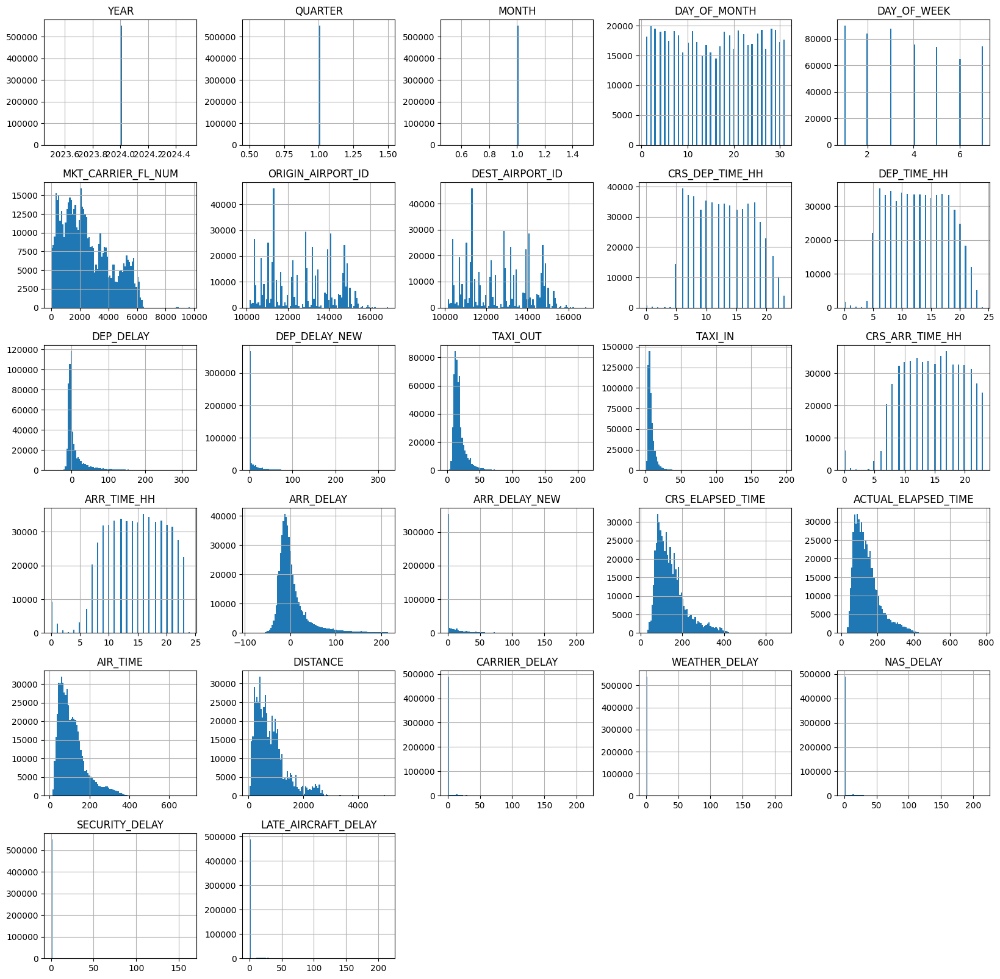

In [14]:
flight_df_new[['YEAR', 'QUARTER', 'MONTH', 'DAY_OF_MONTH', 'DAY_OF_WEEK','MKT_UNIQUE_CARRIER', 'MKT_CARRIER_FL_NUM', 'ORIGIN_AIRPORT_ID', 'ORIGIN',
               'ORIGIN_CITY_NAME', 'ORIGIN_STATE_ABR', 'DEST_AIRPORT_ID', 'DEST', 'DEST_CITY_NAME', 'DEST_STATE_ABR', 'CRS_DEP_TIME_HH', 'DEP_TIME_HH',
               'DEP_DELAY', 'DEP_DELAY_NEW', 'TAXI_OUT', 'TAXI_IN', 'CRS_ARR_TIME_HH', 'ARR_TIME_HH', 'ARR_DELAY', 'ARR_DELAY_NEW', 'CRS_ELAPSED_TIME',
               'ACTUAL_ELAPSED_TIME', 'AIR_TIME', 'DISTANCE', 'CARRIER_DELAY', 'WEATHER_DELAY', 'NAS_DELAY', 'SECURITY_DELAY', 'LATE_AIRCRAFT_DELAY']].hist(bins=100,figsize=(20,20))

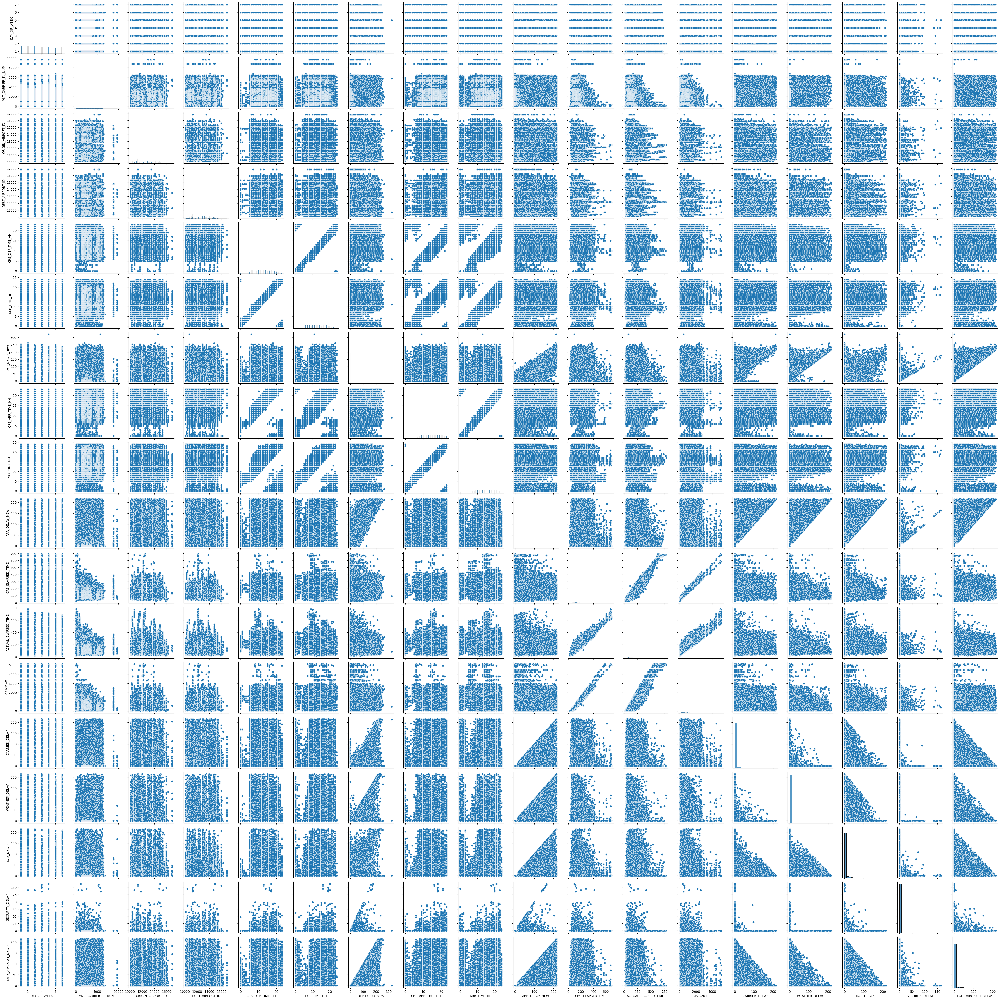

In [15]:
features = ['DAY_OF_WEEK', 'MKT_CARRIER_FL_NUM', 'ORIGIN_AIRPORT_ID', 'DEST_AIRPORT_ID', 'CRS_DEP_TIME_HH', 'DEP_TIME_HH', 'DEP_DELAY_NEW', 'CRS_ARR_TIME_HH', 'ARR_TIME_HH',
              'ARR_DELAY_NEW', 'CRS_ELAPSED_TIME', 'ACTUAL_ELAPSED_TIME','DISTANCE', 'CARRIER_DELAY', 'WEATHER_DELAY', 'NAS_DELAY', 'SECURITY_DELAY', 'LATE_AIRCRAFT_DELAY' ]
sns.pairplot(flight_df_new[features])

# Feature Engineering

## Time of Day
*   Creating a new feature to determine if the flight was in the morning or evening


In [16]:
def get_time_of_day(hour):
    if hour is None:
        return None
    if 300 <= hour < 720:  # 5AM to 12PM
        return 'Morning'
    elif 720 <= hour < 1080:  # 12PM to 6PM
        return 'Afternoon'
    elif 1080 <= hour < 1320: # 6PM to 10PM
        return 'Evening'
    else:
        return 'Night'

flight_df_new['CRS_DEP_TIME_OF_DAY'] = flight_df_new['CRS_DEP_TIME'].apply(get_time_of_day)
flight_df_new['CRS_ARR_TIME_OF_DAY'] = flight_df_new['CRS_ARR_TIME'].apply(get_time_of_day)

## Arrival Delay Class
*   Creating a new column ARR_DELAY_CLASS where the value is 1 if ARR_DELAY_NEW is 15 minutes or more, and 0 if it's less than 15 minutes.

In [17]:
# Using Delayed if ARR_DELAY_NEW is 15 minutes or more
flight_df_new['ARR_DELAY_CLASS'] = flight_df_new['ARR_DELAY_NEW'].apply(lambda x: 1 if x >= 15 else 0)
flight_df_new['ARR_DELAY_CLASS'].value_counts(normalize=True)

,proportion
ARR_DELAY_CLASS,
0,0.769564
1,0.230436


## Carrier Number

In [18]:
flight_df_new['CARRIER_NUM'] = flight_df_new['MKT_UNIQUE_CARRIER'].astype(str) + flight_df_new['MKT_CARRIER_FL_NUM'].astype(str)

In [19]:
flight_df_new.head()

,YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,MKT_UNIQUE_CARRIER,MKT_CARRIER_FL_NUM,OP_UNIQUE_CARRIER,ORIGIN_AIRPORT_ID,ORIGIN,...,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,CRS_DEP_TIME_HH,DEP_TIME_HH,CRS_ARR_TIME_HH,ARR_TIME_HH,CRS_DEP_TIME_OF_DAY,CRS_ARR_TIME_OF_DAY,ARR_DELAY_CLASS,CARRIER_NUM
0,2024,1,1,1,1,AA,1002,AA,13485,MSN,...,0.0,0.0,6,6,9,9,Morning,Afternoon,0,AA1002
1,2024,1,1,1,1,AA,1007,AA,11057,CLT,...,0.0,0.0,22,23,23,23,Night,Night,0,AA1007
2,2024,1,1,1,1,AA,1009,AA,14100,PHL,...,0.0,83.0,17,19,19,20,Night,Night,1,AA1009
3,2024,1,1,1,1,AA,1010,AA,11298,DFW,...,0.0,0.0,21,21,22,23,Night,Night,0,AA1010
4,2024,1,1,1,1,AA,1011,AA,12889,LAS,...,0.0,0.0,8,7,15,14,Afternoon,Night,0,AA1011


# Correlation Matrix

<Axes: >

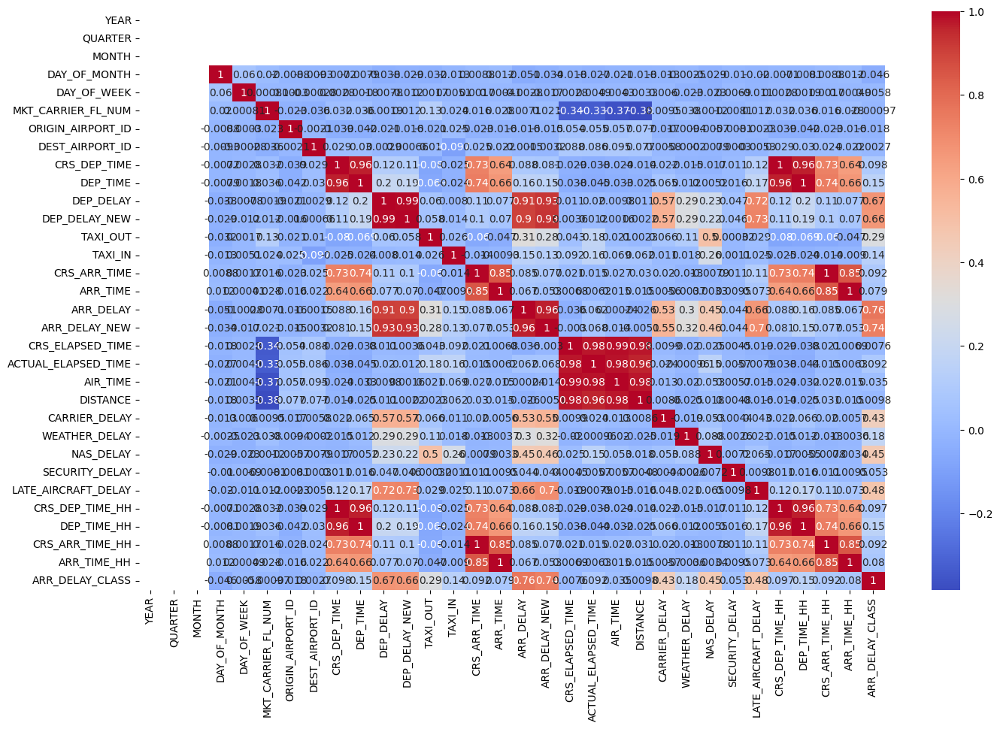

In [20]:
plt.figure(figsize=(16,10))
numerical_df = flight_df_new.select_dtypes(include=['number'])
correlation_matrix = numerical_df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')

# Directed Graph
Creating a directed graph with "ORIGIN" & "DEST" as nodes and "CRS_ELAPSED_TIME" as edge weight

In [21]:
graph = nx.DiGraph()

# Creating a subset of the columns (ORIGIN, DEST, CRS_ELAPSED_TIME) and drop duplicates for (ORIGIN, DEST) pairs
graph_data = flight_df_new[['ORIGIN', 'DEST', 'CRS_ELAPSED_TIME']].drop_duplicates(subset=['ORIGIN', 'DEST'])

# Adding edges to the graph, using ORIGIN and DEST as nodes and CRS_ELAPSED_TIME as edge weight
for _, row in graph_data.iterrows():
    origin = row['ORIGIN']
    dest = row['DEST']
    elapsed_time = row['CRS_ELAPSED_TIME']
    graph.add_edge(origin, dest, weight=elapsed_time)

# Output the number of nodes and edges as a verification
graph.number_of_nodes(), graph.number_of_edges()

(351, 5876)

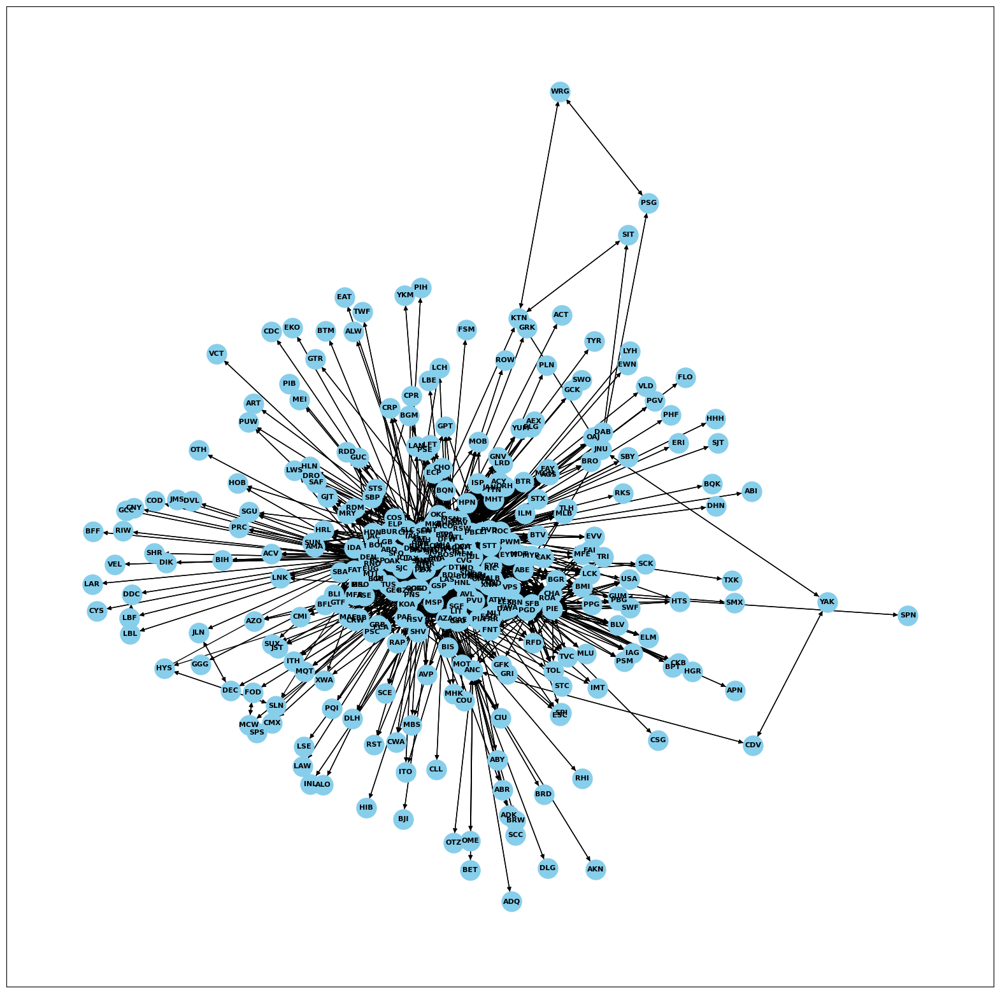

In [22]:
pos = nx.spring_layout(graph)

# use nx.draw_networkx to show graph
plt.figure(figsize=(20, 20))
nx.draw_networkx(graph, pos, with_labels=True, node_size=500, node_color='skyblue', font_size=8, font_color='black', font_weight='bold')
plt.show()

## In-Degree Centrality

The percentage of flights coming to a particular node (Airport)

In [23]:
in_degree_centrality = nx.in_degree_centrality(graph)

# Display the in-degree centrality for each node
# for node, centrality in in_degree_centrality.items():
#     print(f"{node}: {centrality}")
in_degree_df = pd.DataFrame(list(in_degree_centrality.items()), columns=['Node', 'In-Degree Centrality'])
in_degree_df = in_degree_df.sort_values(by='In-Degree Centrality', ascending=False)

in_degree_df.head(10)

,Node,In-Degree Centrality
4,DFW,0.497143
43,DEN,0.471429
28,ORD,0.425714
25,ATL,0.420000
1,CLT,0.377143
5,LAS,0.351429
79,IAH,0.305714
48,MSP,0.300000
8,PHX,0.300000
33,DCA,0.265714


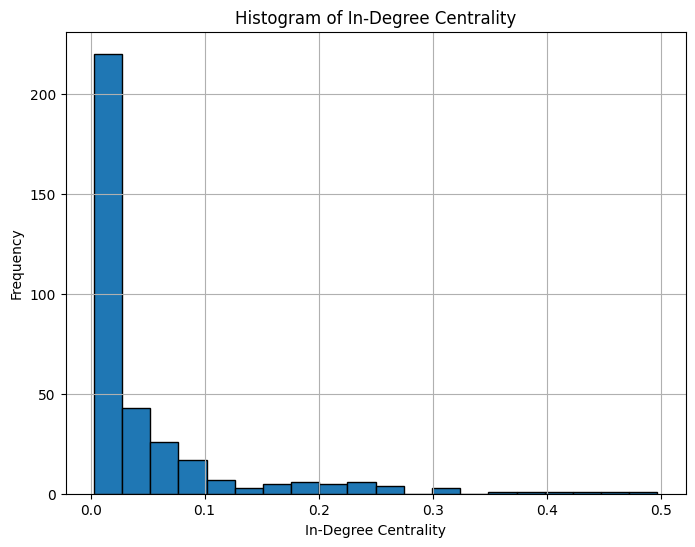

In [25]:
# Extracting the centrality values
centrality_values = list(in_degree_centrality.values())

plt.figure(figsize=(8, 6))
plt.hist(centrality_values, bins=20, edgecolor='black')
plt.title('Histogram of In-Degree Centrality')
plt.xlabel('In-Degree Centrality')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

## Out-Degree Centrality
The percentage of flights moving from a particular node (Airport)

In [26]:
out_degree_centrality = nx.out_degree_centrality(graph)

out_degree_df = pd.DataFrame(list(out_degree_centrality.items()), columns=['Node', 'Out-Degree Centrality'])
out_degree_df = out_degree_df.sort_values(by='Out-Degree Centrality', ascending=False)

out_degree_df.head(10)

,Node,Out-Degree Centrality
4,DFW,0.497143
43,DEN,0.471429
28,ORD,0.425714
25,ATL,0.420000
1,CLT,0.377143
5,LAS,0.351429
79,IAH,0.305714
48,MSP,0.300000
8,PHX,0.300000
88,SEA,0.265714


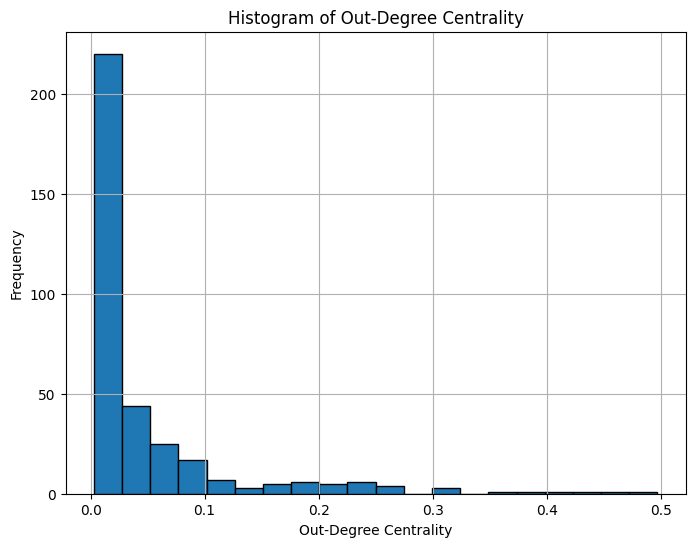

In [27]:
out_centrality_values = list(out_degree_centrality.values())

plt.figure(figsize=(8, 6))
plt.hist(out_centrality_values, bins=20, edgecolor='black')
plt.title('Histogram of Out-Degree Centrality')
plt.xlabel('Out-Degree Centrality')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

### Betweenness Centrality
analyzing how often a node lies on the shortest paths between other nodes. It quantifies the degree to which a node acts as an intermediary

In [28]:
betweenness_centrality = nx.betweenness_centrality(graph)

betweenness_centrality_df = pd.DataFrame(list(betweenness_centrality.items()), columns=['Node', 'Betweenness Centrality'])
betweenness_centrality_df = betweenness_centrality_df.sort_values(by='Betweenness Centrality', ascending=False)

betweenness_centrality_df.head(10)

,Node,Betweenness Centrality
4,DFW,0.178791
43,DEN,0.171471
28,ORD,0.119180
25,ATL,0.084878
1,CLT,0.083575
48,MSP,0.072563
88,SEA,0.069797
69,ANC,0.062548
5,LAS,0.048357
79,IAH,0.041826


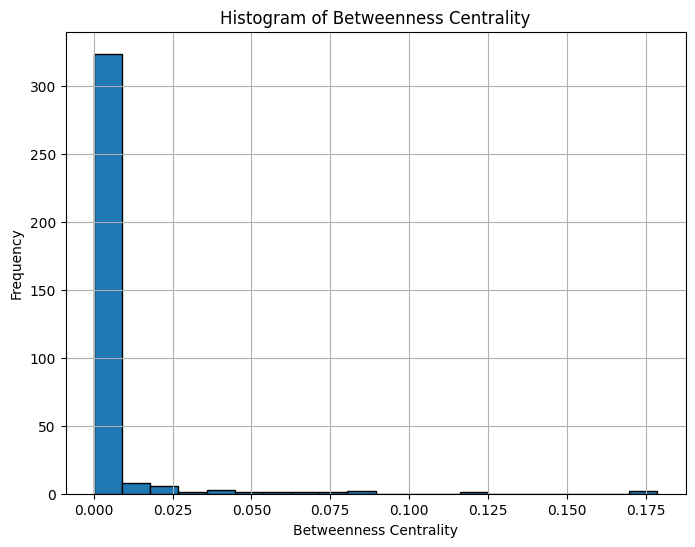

In [30]:
betweenness_centrality_values = list(betweenness_centrality.values())

plt.figure(figsize=(8, 6))
plt.hist(betweenness_centrality_values, bins=20, edgecolor='black')
plt.title('Histogram of Betweenness Centrality')
plt.xlabel('Betweenness Centrality')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

### Closeness Centrality
represents how “close” a node is to all other nodes in the network. A higher closeness centrality score indicates that a node is more central, meaning it has shorter average distances to all other nodes. That node / airport is directly connected or “just a hop away” from most others in the network.

In [31]:
closeness_centrality = nx.closeness_centrality(graph)

closeness_centrality_df = pd.DataFrame(list(closeness_centrality.items()), columns=['Node', 'Closeness Centrality'])
closeness_centrality_df = closeness_centrality_df.sort_values(by='Closeness Centrality', ascending=False)

closeness_centrality_df.head(10)

,Node,Closeness Centrality
4,DFW,0.650558
43,DEN,0.639854
28,ORD,0.621670
25,ATL,0.609756
5,LAS,0.596252
1,CLT,0.590219
48,MSP,0.581395
8,PHX,0.575658
79,IAH,0.569106
88,SEA,0.568182


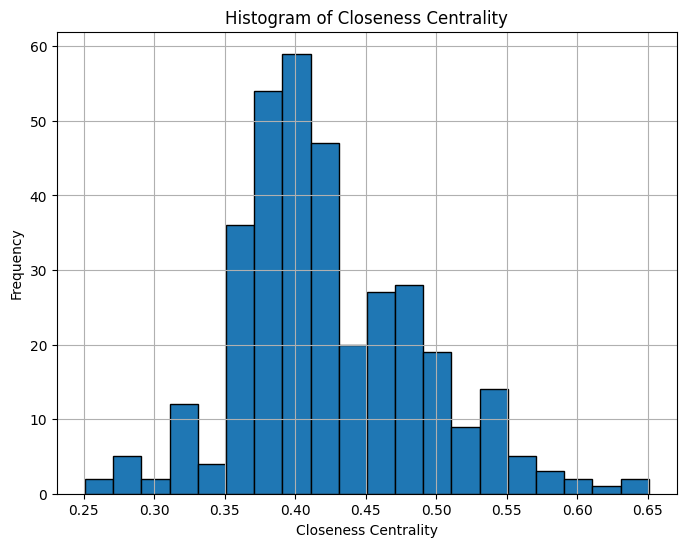

In [32]:
closeness_centrality_values = list(closeness_centrality.values())

plt.figure(figsize=(8, 6))
plt.hist(closeness_centrality_values, bins=20, edgecolor='black')
plt.title('Histogram of Closeness Centrality')
plt.xlabel('Closeness Centrality')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

## Correlation Matrix of Centrality Measures

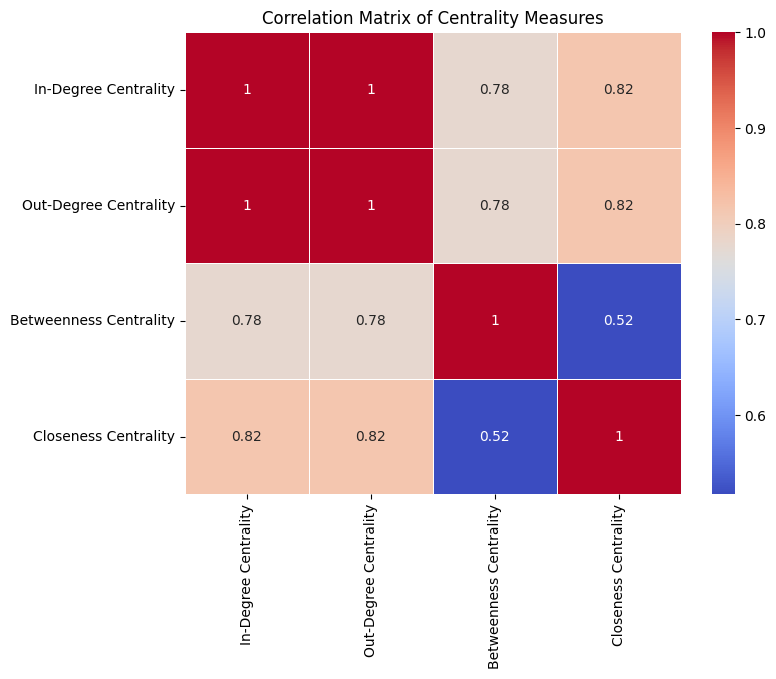

In [33]:
# Combining all centrality measures into a DataFrame
centrality_data = pd.DataFrame({
    'In-Degree Centrality': in_degree_centrality,
    'Out-Degree Centrality': out_degree_centrality,
    'Betweenness Centrality': betweenness_centrality,
    'Closeness Centrality': closeness_centrality
})

correlation_matrix = centrality_data.corr()

plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix of Centrality Measures')
plt.show()

In [34]:
centrality_data

,In-Degree Centrality,Out-Degree Centrality,Betweenness Centrality,Closeness Centrality
MSN,0.040000,0.040000,7.366142e-07,0.471063
CLT,0.377143,0.377143,8.357509e-02,0.590219
STL,0.148571,0.148571,8.562195e-04,0.518519
PHL,0.222857,0.222857,1.574224e-02,0.540958
DFW,0.497143,0.497143,1.787906e-01,0.650558
...,...,...,...,...
SWF,0.011429,0.011429,3.475246e-05,0.321396
STC,0.008571,0.005714,8.500313e-06,0.341797
HGR,0.005714,0.005714,1.254337e-06,0.285249
AKN,0.002857,0.002857,0.000000e+00,0.322284


## Merging Centrality Data with Dataframe

In [35]:
# merge centrality_data with data_cleaned with on "ORIGIN" feature.
centrality_data_origin = centrality_data.copy()
centrality_data_origin.index.name = 'ORIGIN'
centrality_data_origin.reset_index(inplace=True)

centrality_data_origin.head()

,ORIGIN,In-Degree Centrality,Out-Degree Centrality,Betweenness Centrality,Closeness Centrality
0,MSN,0.040000,0.040000,7.366142e-07,0.471063
1,CLT,0.377143,0.377143,8.357509e-02,0.590219
2,STL,0.148571,0.148571,8.562195e-04,0.518519
3,PHL,0.222857,0.222857,1.574224e-02,0.540958
4,DFW,0.497143,0.497143,1.787906e-01,0.650558


In [36]:
data_new_origin = flight_df_new.merge(centrality_data_origin, on='ORIGIN', suffixes=('_ORIGIN', '_ORIGIN'))
data_new_origin

,YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,MKT_UNIQUE_CARRIER,MKT_CARRIER_FL_NUM,OP_UNIQUE_CARRIER,ORIGIN_AIRPORT_ID,ORIGIN,...,CRS_ARR_TIME_HH,ARR_TIME_HH,CRS_DEP_TIME_OF_DAY,CRS_ARR_TIME_OF_DAY,ARR_DELAY_CLASS,CARRIER_NUM,In-Degree Centrality,Out-Degree Centrality,Betweenness Centrality,Closeness Centrality
0,2024,1,1,1,1,AA,1002,AA,13485,MSN,...,9,9,Morning,Afternoon,0,AA1002,0.040000,0.040000,7.366142e-07,0.471063
1,2024,1,1,1,1,AA,1168,AA,13485,MSN,...,19,19,Night,Night,0,AA1168,0.040000,0.040000,7.366142e-07,0.471063
2,2024,1,1,1,1,AA,3888,MQ,13485,MSN,...,20,20,Night,Night,0,AA3888,0.040000,0.040000,7.366142e-07,0.471063
3,2024,1,1,1,1,AA,3890,MQ,13485,MSN,...,15,15,Evening,Night,0,AA3890,0.040000,0.040000,7.366142e-07,0.471063
4,2024,1,1,1,1,AA,5221,OH,13485,MSN,...,16,16,Night,Night,1,AA5221,0.040000,0.040000,7.366142e-07,0.471063
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
551138,2024,1,1,13,6,AS,184,AS,10165,ADK,...,18,18,Night,Night,1,AS184,0.002857,0.002857,0.000000e+00,0.322284
551139,2024,1,1,17,3,AS,184,AS,10165,ADK,...,18,18,Night,Night,0,AS184,0.002857,0.002857,0.000000e+00,0.322284
551140,2024,1,1,24,3,AS,184,AS,10165,ADK,...,18,18,Night,Night,0,AS184,0.002857,0.002857,0.000000e+00,0.322284
551141,2024,1,1,27,6,AS,184,AS,10165,ADK,...,18,17,Night,Night,0,AS184,0.002857,0.002857,0.000000e+00,0.322284


In [37]:
# merge centrality_data with data_cleaned with on "DEST" feature.
centrality_data_dest = centrality_data.copy()
centrality_data_dest.index.name = 'DEST'
centrality_data_dest.reset_index(inplace=True)

centrality_data_dest.head()

,DEST,In-Degree Centrality,Out-Degree Centrality,Betweenness Centrality,Closeness Centrality
0,MSN,0.040000,0.040000,7.366142e-07,0.471063
1,CLT,0.377143,0.377143,8.357509e-02,0.590219
2,STL,0.148571,0.148571,8.562195e-04,0.518519
3,PHL,0.222857,0.222857,1.574224e-02,0.540958
4,DFW,0.497143,0.497143,1.787906e-01,0.650558


In [38]:
data_new_dest = data_new_origin.merge(centrality_data_dest, on='DEST', suffixes=('_ORIGIN', '_DEST'))
data_new_dest

,YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,MKT_UNIQUE_CARRIER,MKT_CARRIER_FL_NUM,OP_UNIQUE_CARRIER,ORIGIN_AIRPORT_ID,ORIGIN,...,ARR_DELAY_CLASS,CARRIER_NUM,In-Degree Centrality_ORIGIN,Out-Degree Centrality_ORIGIN,Betweenness Centrality_ORIGIN,Closeness Centrality_ORIGIN,In-Degree Centrality_DEST,Out-Degree Centrality_DEST,Betweenness Centrality_DEST,Closeness Centrality_DEST
0,2024,1,1,1,1,AA,1002,AA,13485,MSN,...,0,AA1002,0.040000,0.040000,7.366142e-07,0.471063,0.377143,0.377143,0.083575,0.590219
1,2024,1,1,1,1,AA,1168,AA,13485,MSN,...,0,AA1168,0.040000,0.040000,7.366142e-07,0.471063,0.377143,0.377143,0.083575,0.590219
2,2024,1,1,2,2,AA,1002,AA,13485,MSN,...,0,AA1002,0.040000,0.040000,7.366142e-07,0.471063,0.377143,0.377143,0.083575,0.590219
3,2024,1,1,2,2,AA,1168,AA,13485,MSN,...,0,AA1168,0.040000,0.040000,7.366142e-07,0.471063,0.377143,0.377143,0.083575,0.590219
4,2024,1,1,3,3,AA,1002,AA,13485,MSN,...,0,AA1002,0.040000,0.040000,7.366142e-07,0.471063,0.377143,0.377143,0.083575,0.590219
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
551138,2024,1,1,27,6,UA,174,UA,12016,GUM,...,0,UA174,0.005714,0.005714,5.714286e-03,0.334608,0.002857,0.002857,0.000000,0.250896
551139,2024,1,1,28,7,UA,174,UA,12016,GUM,...,0,UA174,0.005714,0.005714,5.714286e-03,0.334608,0.002857,0.002857,0.000000,0.250896
551140,2024,1,1,29,1,UA,174,UA,12016,GUM,...,0,UA174,0.005714,0.005714,5.714286e-03,0.334608,0.002857,0.002857,0.000000,0.250896
551141,2024,1,1,30,2,UA,174,UA,12016,GUM,...,0,UA174,0.005714,0.005714,5.714286e-03,0.334608,0.002857,0.002857,0.000000,0.250896


In [39]:
data_new_dest.columns

Index(['YEAR', 'QUARTER', 'MONTH', 'DAY_OF_MONTH', 'DAY_OF_WEEK',
       'MKT_UNIQUE_CARRIER', 'MKT_CARRIER_FL_NUM', 'OP_UNIQUE_CARRIER',
       'ORIGIN_AIRPORT_ID', 'ORIGIN', 'ORIGIN_CITY_NAME', 'ORIGIN_STATE_ABR',
       'DEST_AIRPORT_ID', 'DEST', 'DEST_CITY_NAME', 'DEST_STATE_ABR',
       'CRS_DEP_TIME', 'DEP_TIME', 'DEP_DELAY', 'DEP_DELAY_NEW', 'TAXI_OUT',
       'TAXI_IN', 'CRS_ARR_TIME', 'ARR_TIME', 'ARR_DELAY', 'ARR_DELAY_NEW',
       'CRS_ELAPSED_TIME', 'ACTUAL_ELAPSED_TIME', 'AIR_TIME', 'DISTANCE',
       'CARRIER_DELAY', 'WEATHER_DELAY', 'NAS_DELAY', 'SECURITY_DELAY',
       'LATE_AIRCRAFT_DELAY', 'CRS_DEP_TIME_HH', 'DEP_TIME_HH',
       'CRS_ARR_TIME_HH', 'ARR_TIME_HH', 'CRS_DEP_TIME_OF_DAY',
       'CRS_ARR_TIME_OF_DAY', 'ARR_DELAY_CLASS', 'CARRIER_NUM',
       'In-Degree Centrality_ORIGIN', 'Out-Degree Centrality_ORIGIN',
       'Betweenness Centrality_ORIGIN', 'Closeness Centrality_ORIGIN',
       'In-Degree Centrality_DEST', 'Out-Degree Centrality_DEST',
       'Betweenn

# Saving Flight Data to CSV

In [40]:
data_new_dest.to_csv('flight_data.csv', index=False)